#Instalando o pycaret para aplicação do Autoiml

In [1]:
!pip3 install pycaret[full]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 483.9/483.9 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 15.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 41.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 62.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 17.6 MB/s eta 0

Realizando as importações do projeto e carregando os dados

In [2]:
import pandas as pd
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler, BorderlineSMOTE
import seaborn as sns

In [4]:
df = pd.read_parquet('FullDataToDb.parquet')

Retirando colunas que não serão utilizadas


In [5]:
df = df.drop(['aircraftSerNum-1','date'], axis="columns")

In [6]:
df


,DeltaPressAltitude-1a,DeltaPressAltitude-2a,DeltaBleedOutTemp-1b,DeltaBleedOutTemp-2b,DeltaBleedMonPress-1b,DeltaBleedMonPress-2b,MeanBleedOutTemp-1b,MeanBleedOutTemp-2b,MeanBleedMonPress-1b,MeanBleedMonPress-2b,MeanPressAltitude-1a,MeanPressAltitude-2a,phaseOfFlight-1,Flight,time_since_maintenance,preFail
0,27.0,24.0,19.250,9.750,111.625,112.250,204.736609,204.961446,55.770472,55.589066,35001.902023,35025.041570,1,1,1037950,0
1,32258.0,32281.0,46.750,39.750,138.500,138.750,210.901265,210.477059,84.130888,83.701238,14700.678297,14709.481384,2,2,2405000,0
2,32215.0,32232.0,48.750,46.250,124.000,126.000,207.049568,207.431237,100.138864,98.983666,18408.192598,18418.968267,0,3,3544700,0
3,602.0,602.0,23.500,13.625,142.375,141.875,202.832240,203.974932,71.176793,89.971161,34995.797687,35022.920577,1,3,4616300,0
4,32945.0,32969.0,25.625,12.000,142.375,141.750,206.352423,205.098620,74.899656,75.209147,13905.362082,13914.070971,2,3,6418300,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138231,2097.0,2093.0,14.000,22.375,13.750,14.000,203.989268,203.850247,52.391456,52.308104,39460.626571,39449.206249,1,606,2966101200,0
138232,38122.0,38111.0,24.250,32.625,138.125,139.375,206.437927,205.288391,74.699921,75.346939,17310.217261,17310.511818,2,606,2967588300,0
138233,36853.0,36830.0,41.000,39.125,123.875,124.625,202.096109,202.120891,82.938608,82.518863,24549.926673,24548.457949,0,607,2969328400,0
138234,98.0,97.0,22.375,31.000,133.750,130.625,203.914419,203.664374,53.228401,53.014577,39005.084119,38993.939642,1,607,2970426800,0


Plotando um mapa de calor em relação a correlação das variáveis do DF

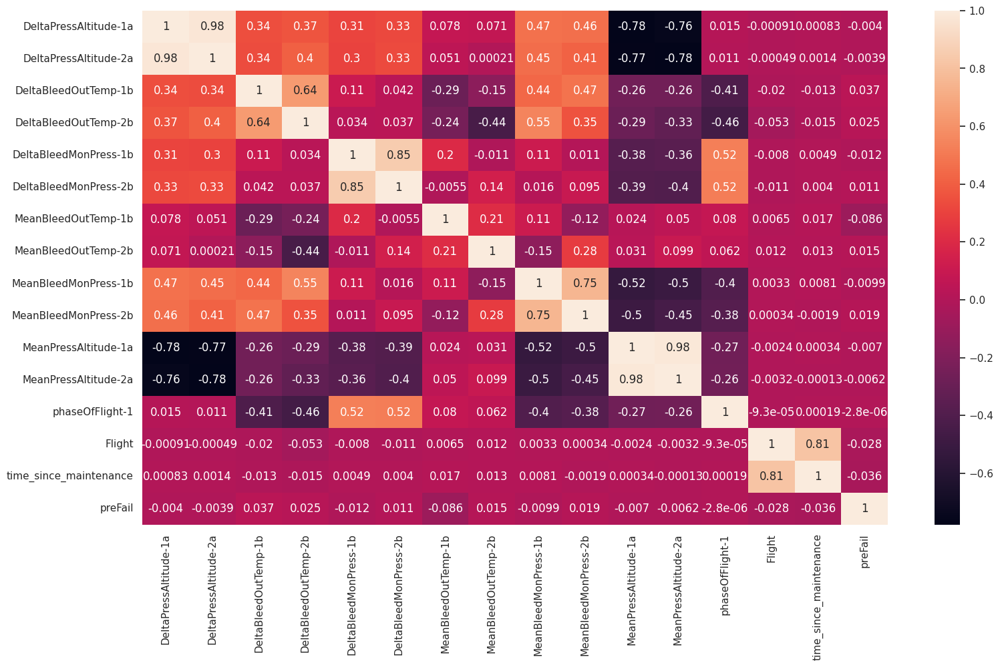

In [7]:

sns.set(rc = {'figure.figsize':(18,10)})
ax = sns.heatmap(df.corr(), annot=True)

Retirando as variáveis que possui alta correlação e selecionando as demais para a normalização.

In [8]:
snVars = ['DeltaPressAltitude-1a',
       'DeltaBleedOutTemp-1b','DeltaBleedMonPress-1b', 'MeanBleedOutTemp-1b',
       'MeanBleedMonPress-1b', 'MeanPressAltitude-1a','time_since_maintenance']
nDf = df[snVars]
nDf

,DeltaPressAltitude-1a,DeltaBleedOutTemp-1b,DeltaBleedMonPress-1b,MeanBleedOutTemp-1b,MeanBleedMonPress-1b,MeanPressAltitude-1a,time_since_maintenance
0,27.0,19.250,111.625,204.736609,55.770472,35001.902023,1037950
1,32258.0,46.750,138.500,210.901265,84.130888,14700.678297,2405000
2,32215.0,48.750,124.000,207.049568,100.138864,18408.192598,3544700
3,602.0,23.500,142.375,202.832240,71.176793,34995.797687,4616300
4,32945.0,25.625,142.375,206.352423,74.899656,13905.362082,6418300
...,...,...,...,...,...,...,...
138231,2097.0,14.000,13.750,203.989268,52.391456,39460.626571,2966101200
138232,38122.0,24.250,138.125,206.437927,74.699921,17310.217261,2967588300
138233,36853.0,41.000,123.875,202.096109,82.938608,24549.926673,2969328400
138234,98.0,22.375,133.750,203.914419,53.228401,39005.084119,2970426800


Analisando a disposição das variáveis numérica para escolha da normalização

In [9]:
baseHist = nDf
def mostra_hist(coluna):
  hist = px.histogram(baseHist,x=coluna)
  hist.show()
for columns in baseHist:
  mostra_hist(columns)

Analizando novamente a correlação antes da normalização apemas com os dados numéricos

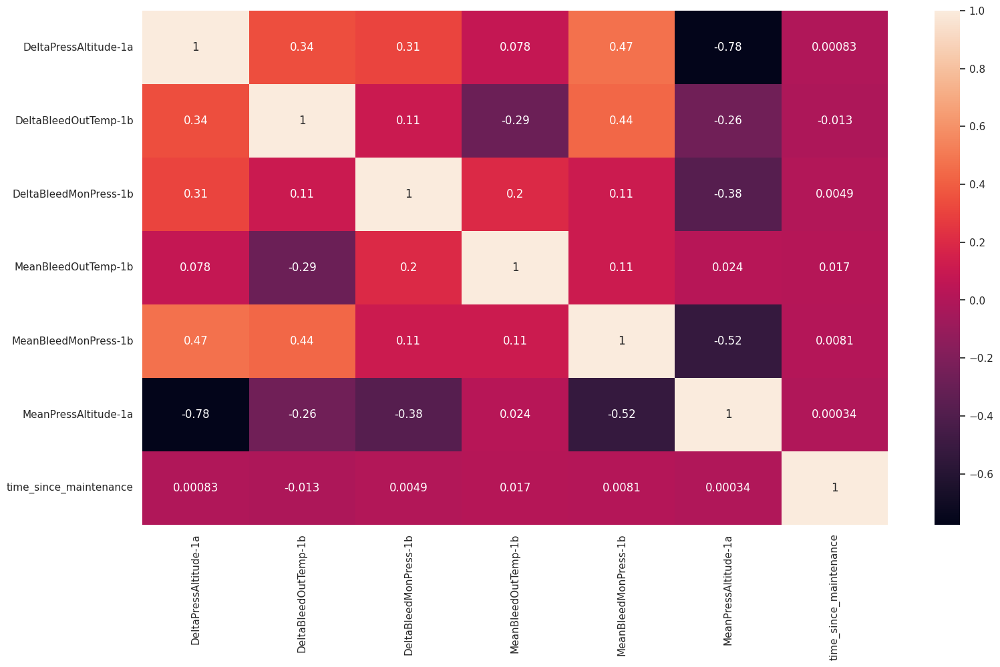

In [19]:
import seaborn as sns
sns.set(rc = {'figure.figsize':(18,10)})
ax = sns.heatmap(nDf.corr(), annot=True)

Aplicando a normalização

In [10]:
scaler = StandardScaler()
scaler.fit(nDf)
scaler.fit_transform(nDf)
nDf_norma = scaler.transform(nDf)

In [11]:
nDf_norma

array([[-1.42217069, -0.34522411,  0.18558091, ..., -0.9975125 ,
         1.19175872, -1.23888823],
       [ 0.59873314,  1.07294013,  0.77072224, ...,  0.51567964,
        -0.99385067, -1.23877034],
       [ 0.59603702,  1.17607935,  0.45501808, ...,  1.36979769,
        -0.59470339, -1.23867206],
       ...,
       [ 0.88684251,  0.77641488,  0.45229649, ...,  0.45206459,
         0.06650954, -0.98292331],
       [-1.41771894, -0.18406908,  0.66730191, ..., -1.13314666,
         1.62273729, -0.9828286 ],
       [ 0.88684251,  0.04154796,  0.80338129, ...,  0.48363337,
        -0.83012413, -0.98266811]])

Criação de diferentes df para unir os valores normalizados e renomeados com os valores não normalizados (prefail e phaseOfFlight)

In [12]:
df3 = pd.DataFrame(nDf_norma)

In [13]:
df3

,0,1,2,3,4,5,6
0,-1.422171,-0.345224,0.185581,0.177404,-0.997512,1.191759,-1.238888
1,0.598733,1.072940,0.770722,0.612977,0.515680,-0.993851,-1.238770
2,0.596037,1.176079,0.455018,0.340830,1.369798,-0.594703,-1.238672
3,-1.386118,-0.126053,0.855091,0.042848,-0.175496,1.191102,-1.238580
4,0.641808,-0.016468,0.855091,0.291572,0.023140,-1.079474,-1.238424
...,...,...,...,...,...,...,...
138231,-1.292380,-0.615965,-1.945422,0.124600,-1.177803,1.671781,-0.983202
138232,0.966410,-0.087376,0.762557,0.297613,0.012483,-0.712910,-0.983073
138233,0.886843,0.776415,0.452296,-0.009164,0.452065,0.066510,-0.982923
138234,-1.417719,-0.184069,0.667302,0.119311,-1.133147,1.622737,-0.982829


In [14]:
df2 =['preFail','phaseOfFlight-1']
df4 = df[df2]

In [15]:
df4

,preFail,phaseOfFlight-1
0,0,1
1,0,2
2,0,0
3,0,1
4,0,2
...,...,...
138231,0,1
138232,0,2
138233,0,0
138234,0,1


In [16]:
dfN = pd.concat([df4,df3],axis=1)

In [17]:
dfN = dfN.rename(columns={0:'DeltaPressAltitude-1a',1:'DeltaBleedOutTemp-1b',2:'DeltaBleedMonPress-1b',3:'MeanBleedOutTemp-1b',4:'MeanBleedMonPress-1b',5:'MeanPressAltitude-1a',6:'time_since_maintenance'})

Analisando a correlação após a normalização e com os outros dados

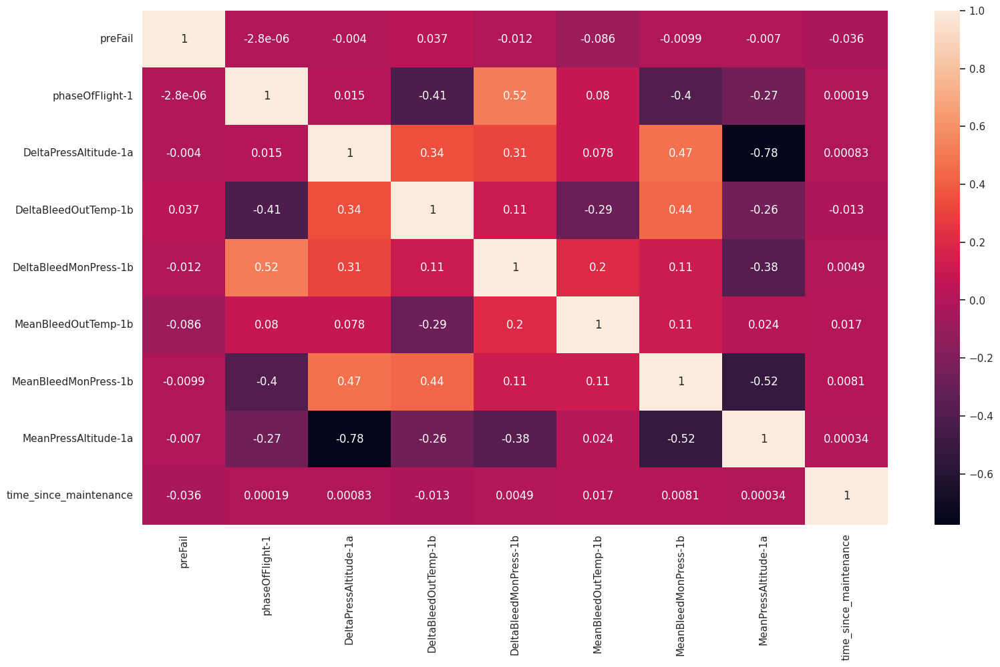

In [18]:
sns.set(rc = {'figure.figsize':(18,10)})
ax = sns.heatmap(dfN.corr(), annot=True)

Divisão de pasta em variaveis em x e y para a aplicação do oversemple utilizando o BorderLineSMOTE


In [ ]:
dfNx = dfN.drop(['preFail'],axis=1)

In [ ]:
 x = dfNx
 y = dfN['preFail']
 ros = BorderlineSMOTE(random_state = 42)
 X_ros_res, y_ros_res = ros.fit_resample(x, y)

Juntando os df para criação do df final e aplicação do pycaret

In [ ]:
 dfN = pd.concat([X_ros_res,y_ros_res], axis='columns')

In [ ]:
from pycaret.classification import *

In [ ]:
s=setup(dfN, target = 'preFail')

In [ ]:
melhor_modelo = compare_models()

In [ ]:
melhor_modelo

In [ ]:
evaluate_model(melhor_modelo)

In [ ]:
create_api(melhor_modelo,"Api")

In [ ]:
create_docker('Api')